## Lecture 02

In [1]:
import cv2
import matplotlib.pyplot as plt

## TO DO
- review comments
- remove all constants from code
- review figure titles fonts

last update: 27/Feb/2021 18:40

## Load multiple faces image ++++++

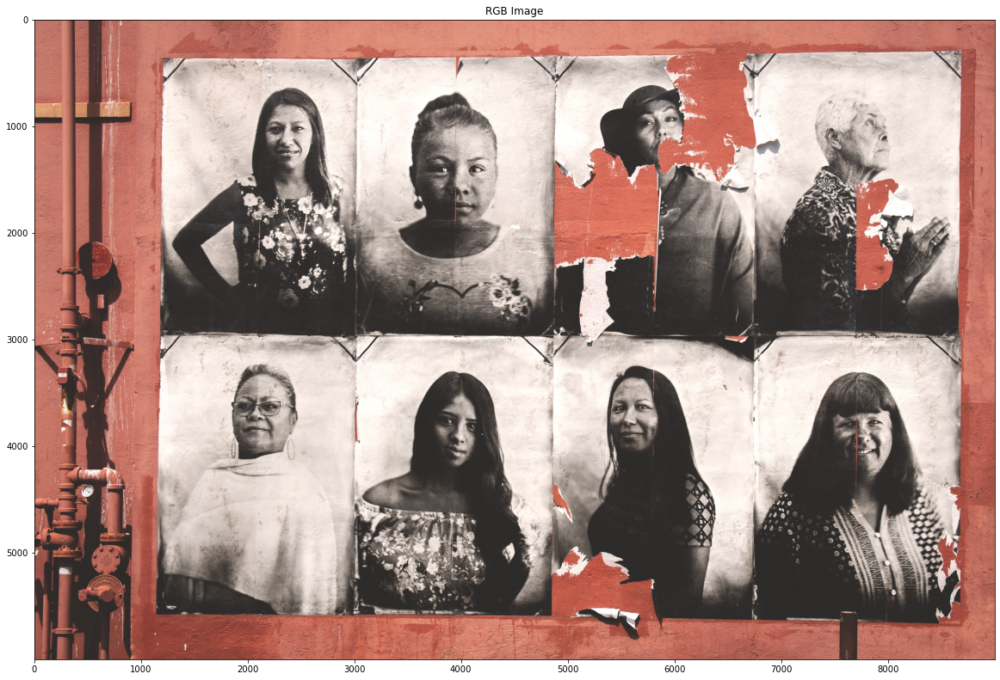

In [2]:
# Load image
image = cv2.imread('../Images/Image-002.jpg')

# Convert to RGB colour space and gray scale for showing and processing
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Show image
plt.figure(figsize=(20,20))
plt.title('RGB Image')
plt.imshow(image_rgb)

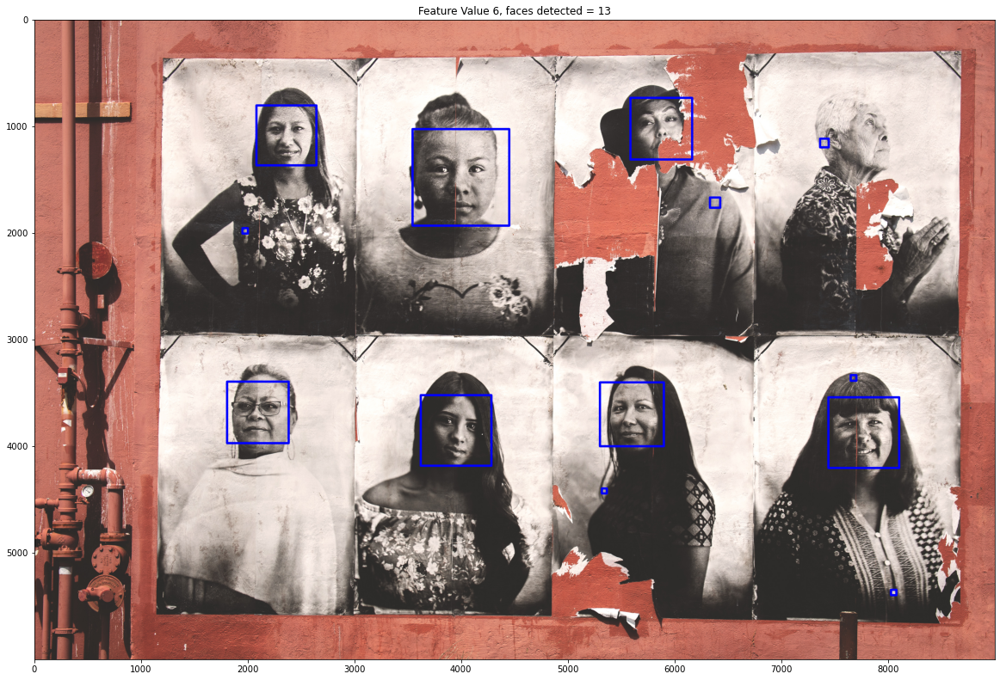

In [3]:
# Create Harr Classifier
classifier = cv2.CascadeClassifier("../Classifiers/haarcascades/haarcascade_frontalface_default.xml")

# Detect faces using multi-scale method
feature_value = 6
faces = classifier.detectMultiScale(image_gray, 1.2, feature_value) # detectMultiScale(image, resizing_step, neighbor features)
# Draw rectangles on top of the detected faces
image_bounding_box = image_rgb.copy()           # copy rgb fro drawing
for (x,y,w,h) in faces:                         # draw faces on image
    cv2.rectangle(image_bounding_box, (x, y), (x+w, y+h), (0,0,255), 20)         # cv2.rectangle(image, start_point, end_point, color, thickness)

# Show image
plt.figure(figsize=(20,20))
plt.title(f'Feature Value {feature_value}, faces detected = {len(faces)}')
plt.imshow(image_bounding_box)

## Sweeping through feature values
And I am not super satisfied with the results, so I will do a quick subploting with a few different parameters:

<Figure size 432x288 with 0 Axes>

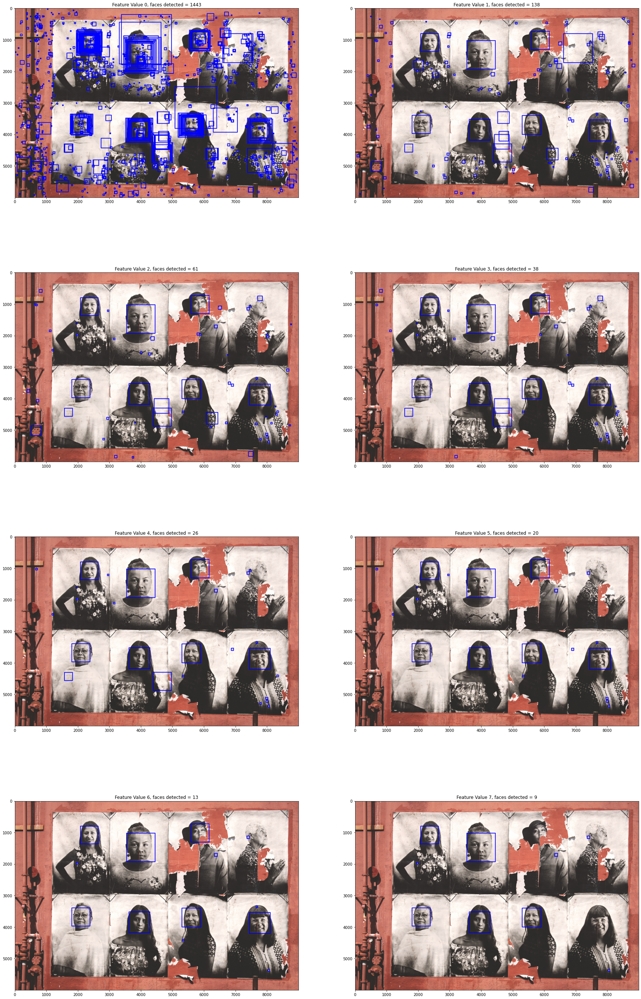

In [4]:
# Create figure foundation for test
plt.figure(1)
plt.figure(figsize=(30,50))         # Set figure size
plt.title("Neighbor Feature Test")  # Set figure title

subplot_list = [421,422,423,424,425,426,427,428] # Create subplot list to place 8 sublots in the figure
counter = 0                                      # Create counter for appropriate indexing through iterations

for feature_value in range(8):                                              # iterate feature values from 0 to 7 
    # Detect faces using multi-scale method 
    faces = classifier.detectMultiScale(image_gray, 1.2, feature_value)       # detectMultiScale(image, resizing_step, neighbor features)
    # Draw rectangles on top of the detected faces
    image_bounding_box = image_rgb.copy()                                     # copy rgb fro drawing
    for (x,y,w,h) in faces:                                                   # draw faces on image
        cv2.rectangle(image_bounding_box, (x, y), (x+w, y+h), (0,0,255), 20)  # cv2.rectangle(image, start_point, end_point, color, thickness)

    # Show image
    
    plt.subplot(subplot_list[counter], title=f'Feature Value {feature_value}, faces detected = {len(faces)}')
    plt.imshow(image_bounding_box)
    
    counter +=1

Turns out "the best" we could get was feature value 6.

## Repeat the process for a second image and save the faces found in a folder

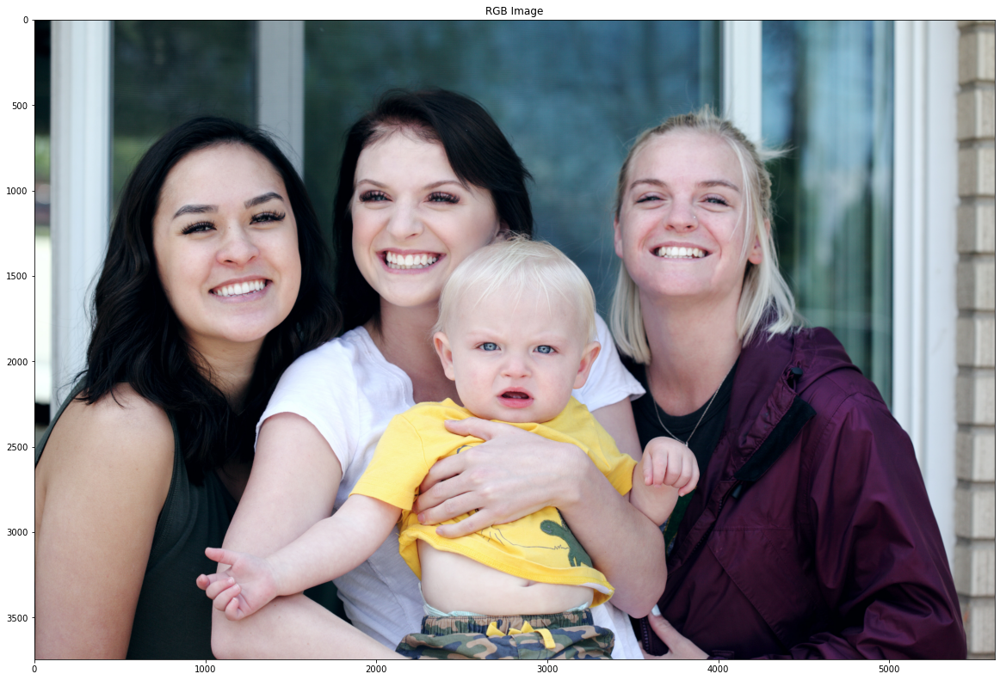

In [5]:
# Load image
image = cv2.imread('../Images/Image-003.jpg')

# Convert to RGB colour space and gray scale for showing and processing
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Show image
plt.figure(figsize=(20,20))
plt.title('RGB Image')
plt.imshow(image_rgb)

## Sweep feature values

<Figure size 432x288 with 0 Axes>

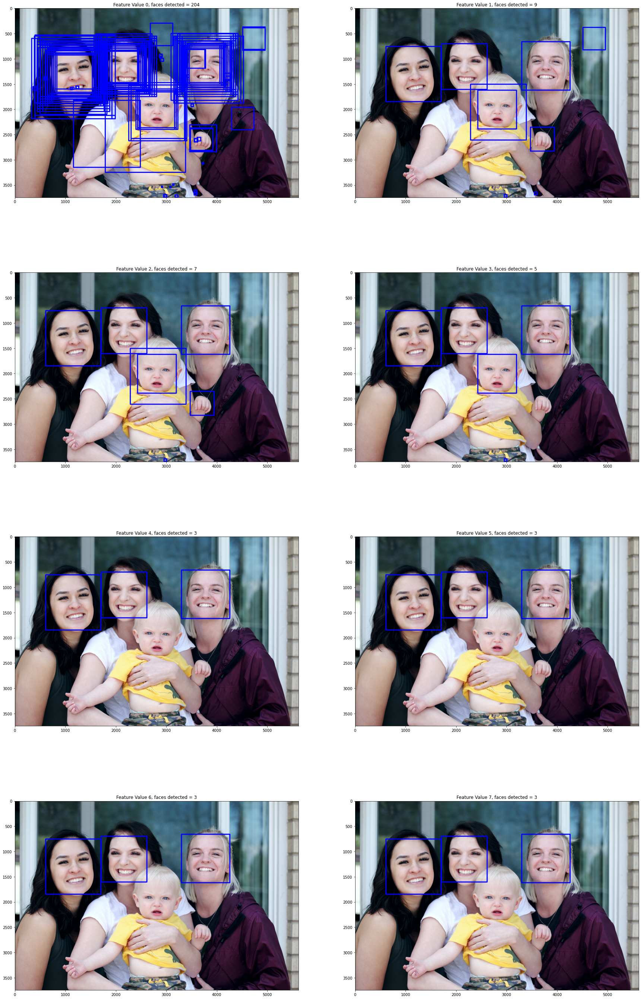

In [6]:
# Create Harr Classifier
classifier = cv2.CascadeClassifier("../Classifiers/haarcascades/haarcascade_frontalface_default.xml")

# Create figure foundation for test
plt.figure(1)
plt.figure(figsize=(30,50))         # Set figure size
plt.title("Neighbor Feature Test")  # Set figure title

subplot_list = [421,422,423,424,425,426,427,428] # Create subplot list to place 8 sublots in the figure
counter = 0                                      # Create counter for appropriate indexing through iterations

for feature_value in range(8):                                              # iterate feature values from 0 to 7 
    # Detect faces using multi-scale method 
    faces = classifier.detectMultiScale(image_gray, 1.2, feature_value)       # detectMultiScale(image, resizing_step, neighbor features)
    # Draw rectangles on top of the detected faces
    image_bounding_box = image_rgb.copy()                                     # copy rgb fro drawing
    for (x,y,w,h) in faces:                                                   # draw faces on image
        cv2.rectangle(image_bounding_box, (x, y), (x+w, y+h), (0,0,255), 20)  # cv2.rectangle(image, start_point, end_point, color, thickness)

    # Show image
    
    plt.subplot(subplot_list[counter], title=f'Feature Value {feature_value}, faces detected = {len(faces)}')
    plt.imshow(image_bounding_box)
    
    counter +=1

## Select best feature and save faces in image folder

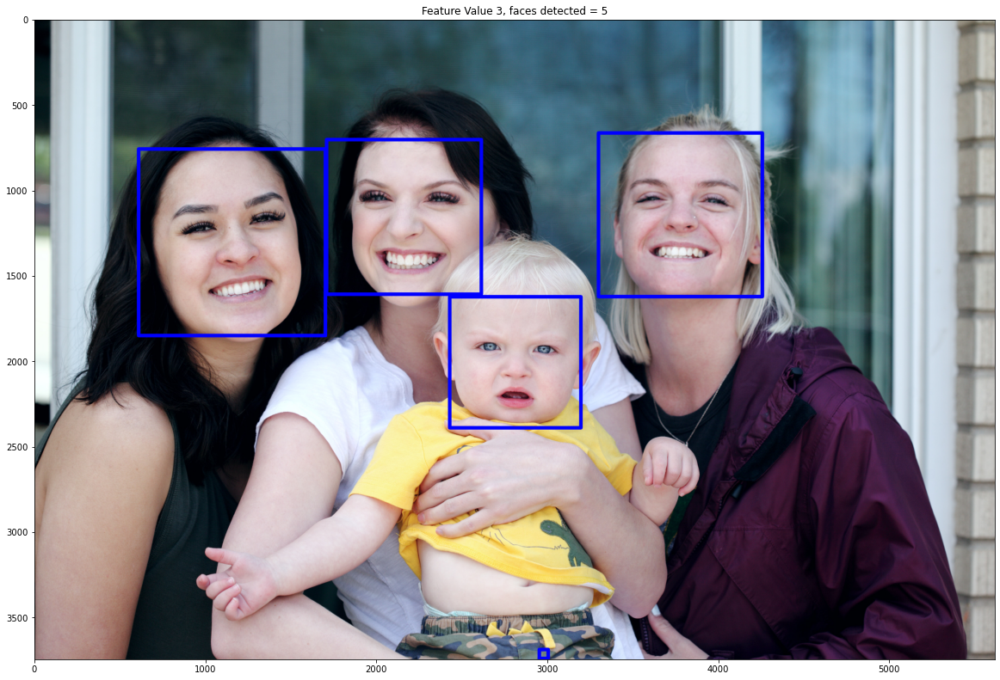

In [7]:
# Detect faces using multi-scale method
feature_value = 3                                                         # select feature value manually
faces = classifier.detectMultiScale(image_gray, 1.2, feature_value)       # detectMultiScale(image, resizing_step, neighbor features)
# Draw rectangles on top of the detected faces
image_bounding_box = image_rgb.copy()                                     # copy rgb fro drawing
for (x,y,w,h) in faces:                                                   # draw faces on image
    cv2.rectangle(image_bounding_box, (x, y), (x+w, y+h), (0,0,255), 20)  # cv2.rectangle(image, start_point, end_point, color, thickness)

# Show image with bounding boxes
plt.figure(figsize=(20,20))
plt.title(f'Feature Value {feature_value}, faces detected = {len(faces)}')
plt.imshow(image_bounding_box)

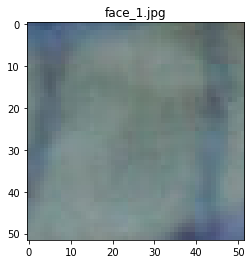

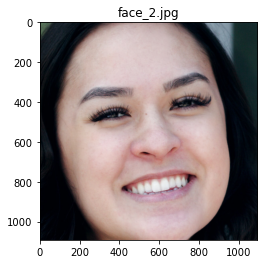

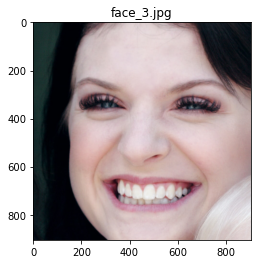

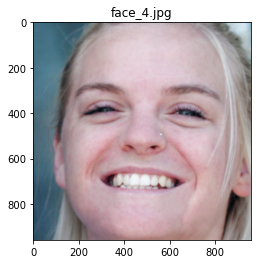

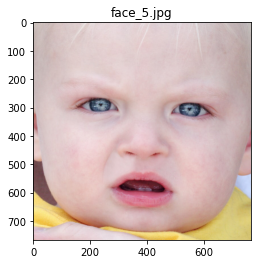

In [8]:
# Save faces as .jpg and show them in the notebook
faces_counter = 0                        # create a counter for naming save files for each iteration
for (x,y,w,h) in faces:
    faces_counter += 1
    image_roi = image[y:y+h, x:x+w]      # get roi from BGR image
    cv2.imwrite(f'../Images/Lecture Images/lecture-002-face_00{faces_counter}.jpg',image_roi)
    
    # Show face image
    plt.figure()
    plt.imshow(cv2.cvtColor(image_roi, cv2.COLOR_BGR2RGB))
    plt.title(f'face_{faces_counter}.jpg')